In [1]:
%matplotlib inline
%reload_ext autoreload

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import seaborn as sns
import logging

FORMAT = "%(asctime)s %(message)s"

logging.basicConfig(level="INFO", format=FORMAT, datefmt="%d-%b-%y %H:%M:%S")
sns.set_context("talk")

In [3]:
epoch_key = 'Jaq', 3, 12

In [4]:
from src.load_data import load_data


data = load_data(epoch_key,
                 position_to_linearize=['nose_x', 'nose_y'],
                 max_distance_from_well=30,
                 min_distance_traveled=50,
                 )

27-Feb-22 17:19:19 Loading position info...
27-Feb-22 17:20:13 Loading multiunit...
27-Feb-22 17:20:36 Loading spikes...
27-Feb-22 17:20:43 Finding ripple times...


In [5]:
import numpy as np

detector_parameters = {
    'movement_var': 6.0,
    'replay_speed': 1,
    'place_bin_size': 2.0,
    'spike_model_knot_spacing': 8.0,
    'spike_model_penalty': 1E-5,
    'movement_state_transition_type': 'random_walk',
    'multiunit_model_kwargs': {
        'mark_std': 24.0, 'position_std': 4.0, 'block_size': 100},
    'discrete_state_transition_type': 'constant',
    'discrete_diagonal': np.array([0.02, 0.98])
}

In [6]:
from replay_identification import ReplayDetector
from src.parameters import WTRACK_EDGE_ORDER, WTRACK_EDGE_SPACING

non_local_detector = ReplayDetector(**detector_parameters)
logging.info(non_local_detector)

non_local_detector.fit(
    is_ripple=data['is_ripple'],
    speed=data['position_info'].nose_vel,
    position=data['position_info'].linear_position,
    spikes=data['spikes'],
    track_graph=data['track_graph'],
    edge_order=WTRACK_EDGE_ORDER,
    edge_spacing=WTRACK_EDGE_SPACING,
    use_gpu=True,
)

non_local_results = non_local_detector.predict(
    speed=data['position_info'].nose_vel,
    position=data['position_info'].linear_position,
    spikes=data['spikes'],
    time=data['position_info'].index / np.timedelta64(1, 's'),
    use_likelihoods=['spikes'],
    use_acausal=True,
    set_no_spike_to_equally_likely=False,
    use_gpu=False,
)
logging.info('Done!')

27-Feb-22 17:21:23 ReplayDetector(discrete_diagonal=array([0.02, 0.98]),
               discrete_state_transition_penalty=1e-05,
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_t...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 24.0,
                                       'position_std': 4.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place_bin_size=2.0, position_range=None, replay_speed=1,
               speed_knots=None, speed_threshold=4.0,
               spike_model_knot_spacing=8.0, spik

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

27-Feb-22 17:30:59 Finding causal non-local probability and position...
27-Feb-22 17:31:10 Finding acausal non-local probability and position...
27-Feb-22 17:31:53 Done!


In [7]:
from replay_identification.spiking_likelihood import *
import scipy.stats

design_matrix = non_local_detector._spiking_likelihood.keywords['design_matrix']
place_field_coefficients = non_local_detector._spiking_likelihood.keywords['place_field_coefficients']
place_conditional_intensity = non_local_detector._spiking_likelihood.keywords['place_conditional_intensity']
is_track_interior = non_local_detector._spiking_likelihood.keywords['is_track_interior']

spikes = np.asarray(data['spikes'])
position = np.asarray(data['position_info'].linear_position)

local_design_matrix = make_spline_predict_matrix(
    design_matrix.design_info, position)
local_conditional_intensity = get_firing_rate(
    local_design_matrix, place_field_coefficients, sampling_frequency=1)

non_local_likelihood = (combined_likelihood(
        spikes.T[..., np.newaxis],
        place_conditional_intensity.T[:, np.newaxis, :])).squeeze()
local_likelihood = (combined_likelihood(
        spikes.T, local_conditional_intensity.T)
    ).squeeze()
# non_local_likelihood[~is_track_interior] = np.nan
# local_likelihood[~is_track_interior] = np.nan

log_likelihood_ratio = non_local_likelihood - local_likelihood[:, np.newaxis]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns
import copy

from scipy.stats import zscore


def plot_detector(time_slice, data, replay_detector, detector_results,
                  figsize=(11, 6.0)):
    fig, axes = plt.subplots(6, 1,
                             figsize=figsize,
                             sharex=True,
                             constrained_layout=True,
                             gridspec_kw={
                                 'height_ratios': [1, 1, 3, 1, 3, 1]},
                            dpi=100)
    time = data['spikes'].iloc[time_slice].index / np.timedelta64(1, 's')
    
    # axes 0
    # max_consensus = np.ceil(zscore(data['ripple_consensus_trace'], nan_policy='omit').values.max()).astype(int)
    start_time = data['spikes'].iloc[time_slice].index.min()
    end_time = data['spikes'].iloc[time_slice].index.max()
    ripple_consensus_trace = zscore(data['ripple_consensus_trace'], nan_policy='omit').loc[start_time:end_time]
    
    max_consensus = max(int(np.ceil(ripple_consensus_trace.max())), 5)
    min_consensus = min(int(np.ceil(ripple_consensus_trace.min())), -1)
    ripple_consensus_trace_time = ripple_consensus_trace.index / np.timedelta64(1, 's')
    
    axes[0].fill_between(
        time, np.ones_like(time) * max_consensus,
        where=data['ripple_labels'].iloc[time_slice].values.squeeze() > 0,
        color='red', zorder=-2, alpha=0.6, step='pre')
    axes[0].fill_between(
        ripple_consensus_trace_time,
        ripple_consensus_trace.values.squeeze(), color='black')
    axes[0].set_ylim((min_consensus, max_consensus))
    axes[0].set_yticks((min_consensus, max_consensus))
    axes[0].set_ylabel("Ripple\nStd.")
    
    # axes 1
    multiunit_firing = (
        data["multiunit_firing_rate"]
        .reset_index(drop=True)
        .set_index(
            data["multiunit_firing_rate"].index / np.timedelta64(1, "s"))
    )
    max_multiunit = np.ceil(data["multiunit_firing_rate"].values.max()).astype(int)
    axes[1].fill_between(
        multiunit_firing.iloc[time_slice].index.values,
        multiunit_firing.iloc[time_slice].values.squeeze(),
        color="black",
    )
    axes[1].fill_between(
        time, np.ones_like(time) * max_multiunit,
        where=data["multiunit_high_synchrony_labels"].iloc[time_slice].values.squeeze() > 0,
        color='blue', zorder=-2, alpha=0.6, step='pre')
    axes[1].set_ylim((0, max_multiunit))
    axes[1].set_yticks((0, max_multiunit))
    axes[1].set_ylabel("Multiunit\nRate\n[spikes / s]")

    # axes 2
    try:
        place_fields = (
            replay_detector._spiking_likelihood
            .keywords['place_conditional_intensity']).squeeze()
        n_neurons = place_fields.shape[1]
        place_field_max = np.nanargmax(place_fields, axis=0)
        linear_position_order = place_field_max.argsort(axis=0).squeeze()
        spike_time_slice, neuron_ind = np.nonzero(
            np.asarray(data['spikes'].iloc[time_slice])[:, linear_position_order])
        axes[2].set_ylabel('Cells')
    except AttributeError:
        spike_time_slice, neuron_ind = np.nonzero(np.any(~np.isnan(
            data['multiunits'].isel(time=time_slice)), axis=1).values)
        n_neurons = data['multiunits'].shape[-1]
        axes[2].set_ylabel('Tetrodes')

    axes[2].scatter(time[spike_time_slice], neuron_ind,
                    clip_on=False, s=10, color='black', marker='|', rasterized=True)
    axes[2].set_ylim((0, n_neurons))
    axes[2].set_yticks((0, n_neurons))
    axes[2].fill_between(
        time, np.ones_like(time) * n_neurons,
        where=detector_results.isel(time=time_slice).non_local_probability >= 0.80,
        color='green', zorder=-1, alpha=0.6, step='pre')
    
    # axes 3
    detector_results.isel(time=time_slice).non_local_probability.plot(
        x='time', ax=axes[3], color='black', clip_on=False)
    axes[3].set_ylabel('Prob.')
    axes[3].set_xlabel("")
    axes[3].set_ylim((0, 1))

    cmap = copy.copy(plt.get_cmap('bone_r'))
    cmap.set_bad(color="lightgrey", alpha=1.0)

    # axes 4
    (detector_results
     .isel(time=time_slice)
     .acausal_posterior
     .sum('state')
     .where(replay_detector.is_track_interior_)
     .plot(x='time', y='position', ax=axes[4], cmap=cmap,
           vmin=0.0, vmax=0.05))
    axes[4].scatter(data['position_info'].iloc[time_slice].index /
                    np.timedelta64(1, 's'),
                    data['position_info'].iloc[time_slice].linear_position,
                    s=1,
                    color='magenta', clip_on=False)
    axes[4].set_xlabel("")
    max_position = np.ceil(data['position_info'].linear_position.max()).astype(int)
    axes[4].set_yticks((0.0, max_position))
    axes[4].set_ylim((0.0, max_position))
    axes[4].set_ylabel('Position [cm]')
    
    # axes 5
    speed = np.asarray(data['position_info'].iloc[time_slice].nose_vel).squeeze()
    max_speed = np.ceil(speed.max()).astype(int)
    max_speed = max(5, max_speed)
    axes[5].fill_between(time, speed, color='grey')
    axes[5].axhline(4, color='black', linestyle='--', linewidth=1)
    axes[5].set_ylabel('Speed\n[cm / s]')
    axes[5].set_yticks((0.0, max_speed))
    axes[5].set_ylim((0.0, max_speed))
    
    axes[-1].set_xlabel('Time [s]')
    axes[-1].xaxis.set_major_formatter(plt.FormatStrFormatter('%.1f'))
    sns.despine(offset=5)

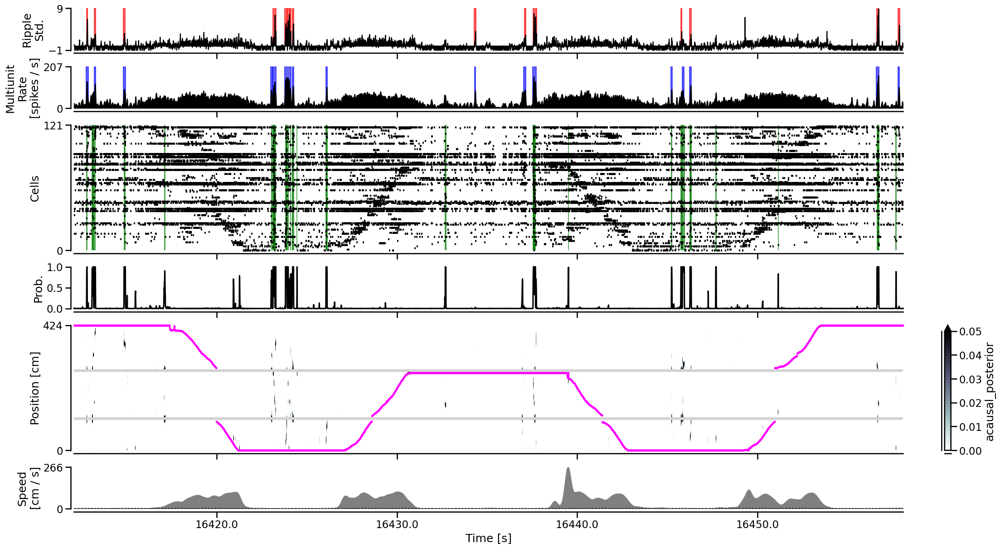

In [10]:
time_slice = slice(22_000, 45_000)
plot_detector(time_slice, data, non_local_detector, non_local_results, figsize=(22, 12.0))

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns
import copy

from scipy.stats import zscore


def plot_detector2(time_slice, data, replay_detector, detector_results, log_likelihood_ratio,
                   figsize=(11, 6.0)):
    fig, axes = plt.subplots(7, 1,
                             figsize=figsize,
                             sharex=True,
                             constrained_layout=True,
                             gridspec_kw={
                                 'height_ratios': [1, 1, 3, 3, 1, 3, 1]},
                            dpi=100)
    time = data['spikes'].iloc[time_slice].index / np.timedelta64(1, 's')
    max_position = np.ceil(data['position_info'].linear_position.max()).astype(int)
    
    # axes 0
    # max_consensus = np.ceil(zscore(data['ripple_consensus_trace'], nan_policy='omit').values.max()).astype(int)
    start_time = data['spikes'].iloc[time_slice].index.min()
    end_time = data['spikes'].iloc[time_slice].index.max()
    ripple_consensus_trace = zscore(data['ripple_consensus_trace'], nan_policy='omit').loc[start_time:end_time]
    
    max_consensus = max(int(np.ceil(ripple_consensus_trace.max())), 5)
    min_consensus = min(int(np.ceil(ripple_consensus_trace.min())), -1)
    ripple_consensus_trace_time = ripple_consensus_trace.index / np.timedelta64(1, 's')
    
    axes[0].fill_between(
        time, np.ones_like(time) * max_consensus,
        where=data['ripple_labels'].iloc[time_slice].values.squeeze() > 0,
        color='red', zorder=-2, alpha=0.6, step='pre')
    axes[0].fill_between(
        ripple_consensus_trace_time,
        ripple_consensus_trace.values.squeeze(), color='black')
    axes[0].set_ylim((min_consensus, max_consensus))
    axes[0].set_yticks((min_consensus, max_consensus))
    axes[0].set_ylabel("Ripple\nStd.")
    
    # axes 1
    multiunit_firing = (
        data["multiunit_firing_rate"]
        .reset_index(drop=True)
        .set_index(
            data["multiunit_firing_rate"].index / np.timedelta64(1, "s"))
    )
    max_multiunit = np.ceil(data["multiunit_firing_rate"].values.max()).astype(int)
    axes[1].fill_between(
        multiunit_firing.iloc[time_slice].index.values,
        multiunit_firing.iloc[time_slice].values.squeeze(),
        color="black",
    )
    axes[1].fill_between(
        time, np.ones_like(time) * max_multiunit,
        where=data["multiunit_high_synchrony_labels"].iloc[time_slice].values.squeeze() > 0,
        color='blue', zorder=-2, alpha=0.6, step='pre')
    axes[1].set_ylim((0, max_multiunit))
    axes[1].set_yticks((0, max_multiunit))
    axes[1].set_ylabel("Multiunit\nRate\n[spikes / s]")

    # axes 2
    try:
        place_fields = (
            replay_detector._spiking_likelihood
            .keywords['place_conditional_intensity']).squeeze()
        n_neurons = place_fields.shape[1]
        place_field_max = np.nanargmax(place_fields, axis=0)
        linear_position_order = place_field_max.argsort(axis=0).squeeze()
        spike_time_slice, neuron_ind = np.nonzero(
            np.asarray(data['spikes'].iloc[time_slice])[:, linear_position_order])
        axes[2].set_ylabel('Cells')
    except AttributeError:
        spike_time_slice, neuron_ind = np.nonzero(np.any(~np.isnan(
            data['multiunits'].isel(time=time_slice)), axis=1).values)
        n_neurons = data['multiunits'].shape[-1]
        axes[2].set_ylabel('Tetrodes')

    axes[2].scatter(time[spike_time_slice], neuron_ind,
                    clip_on=False, s=10, color='black', marker='|', rasterized=True)
    axes[2].set_ylim((0, n_neurons))
    axes[2].set_yticks((0, n_neurons))
    axes[2].fill_between(
        time, np.ones_like(time) * n_neurons,
        where=detector_results.isel(time=time_slice).non_local_probability >= 0.80,
        color='green', zorder=-1, alpha=0.6, step='pre')
    # axes 3
    t, p = np.meshgrid(time, replay_detector.place_bin_centers_)
    cmap2 = axes[3].pcolormesh(t, p, log_likelihood_ratio[time_slice].T,
                       cmap='RdBu_r', vmin=-10, vmax=10)
    axes[3].set_title('Log Likelihood Ratio')
    axes[3].set_yticks((0.0, max_position))
    axes[3].set_ylim((0.0, max_position))
    plt.colorbar(cmap2, ax=axes[3])
    
    # axes 4
    detector_results.isel(time=time_slice).non_local_probability.plot(
        x='time', ax=axes[4], color='black', clip_on=False)
    axes[4].set_ylabel('Prob.')
    axes[4].set_xlabel("")
    axes[4].set_ylim((0, 1))

    cmap = copy.copy(plt.get_cmap('bone_r'))
    cmap.set_bad(color="lightgrey", alpha=1.0)

    # axes 5
    (detector_results
     .isel(time=time_slice)
     .acausal_posterior
     .sum('state')
     .where(replay_detector.is_track_interior_)
     .plot(x='time', y='position', ax=axes[5], cmap=cmap,
           vmin=0.0, vmax=0.05))
    axes[5].scatter(data['position_info'].iloc[time_slice].index /
                    np.timedelta64(1, 's'),
                    data['position_info'].iloc[time_slice].linear_position,
                    s=1,
                    color='magenta', clip_on=False)
    axes[5].set_xlabel("")
    axes[5].set_yticks((0.0, max_position))
    axes[5].set_ylim((0.0, max_position))
    axes[5].set_ylabel('Position [cm]')
    
    # axes 6
    speed = np.asarray(data['position_info'].iloc[time_slice].nose_vel).squeeze()
    max_speed = np.ceil(speed.max()).astype(int)
    max_speed = max(5, max_speed)
    axes[6].fill_between(time, speed, color='grey')
    axes[6].axhline(4, color='black', linestyle='--', linewidth=1)
    axes[6].set_ylabel('Speed\n[cm / s]')
    axes[6].set_yticks((0.0, max_speed))
    axes[6].set_ylim((0.0, max_speed))
    
    axes[-1].set_xlabel('Time [s]')
    axes[-1].xaxis.set_major_formatter(plt.FormatStrFormatter('%.1f'))
    sns.despine(offset=5)

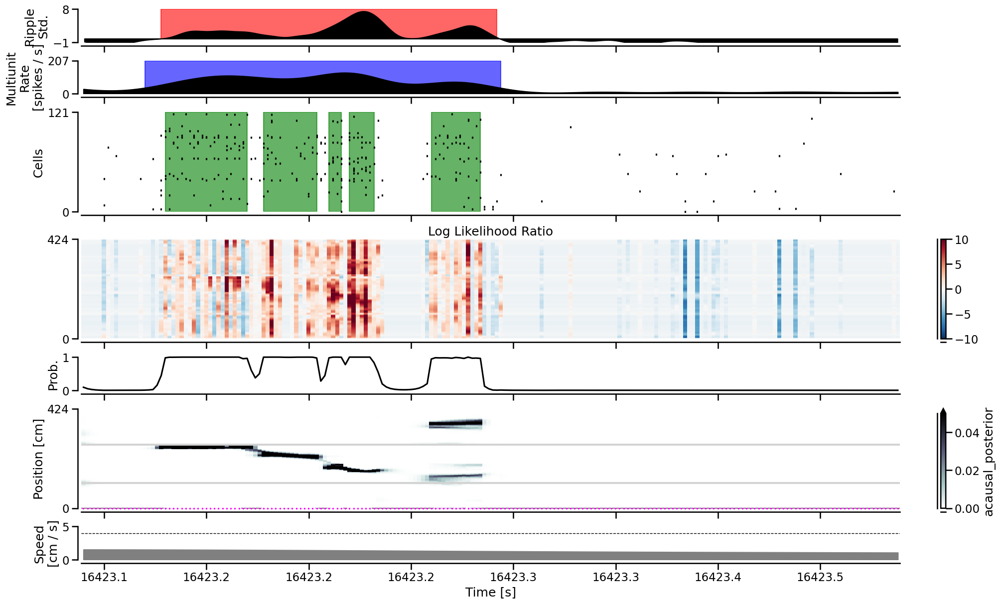

In [29]:
time_slice = slice(27_500, 27_700)
plot_detector2(time_slice, data, non_local_detector, non_local_results,
               log_likelihood_ratio,
               figsize=(20, 12.0))

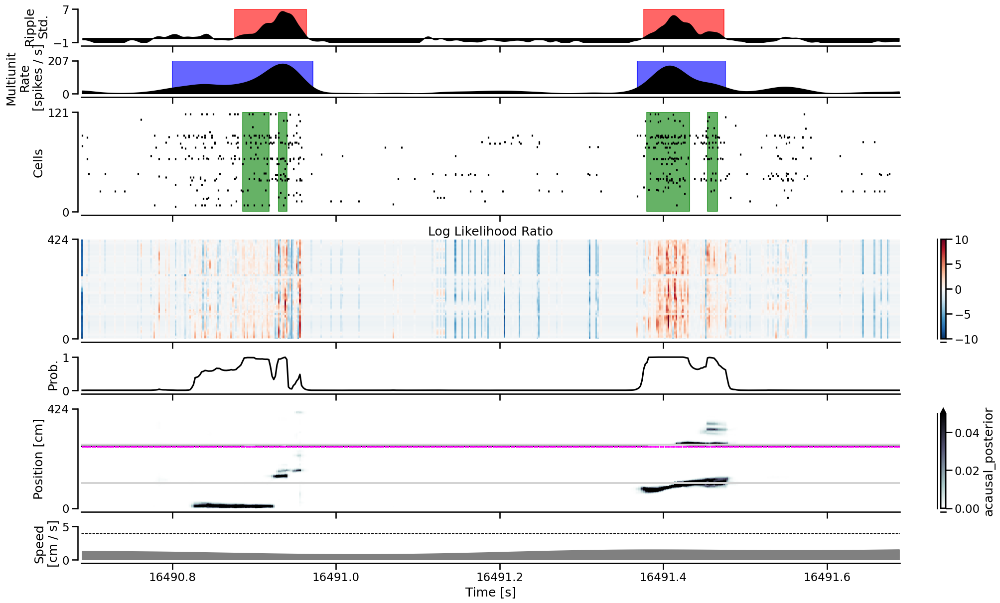

In [30]:
time_slice = slice(61_300, 61_800)
plot_detector2(time_slice, data, non_local_detector, non_local_results,
               log_likelihood_ratio,
               figsize=(20, 12.0))

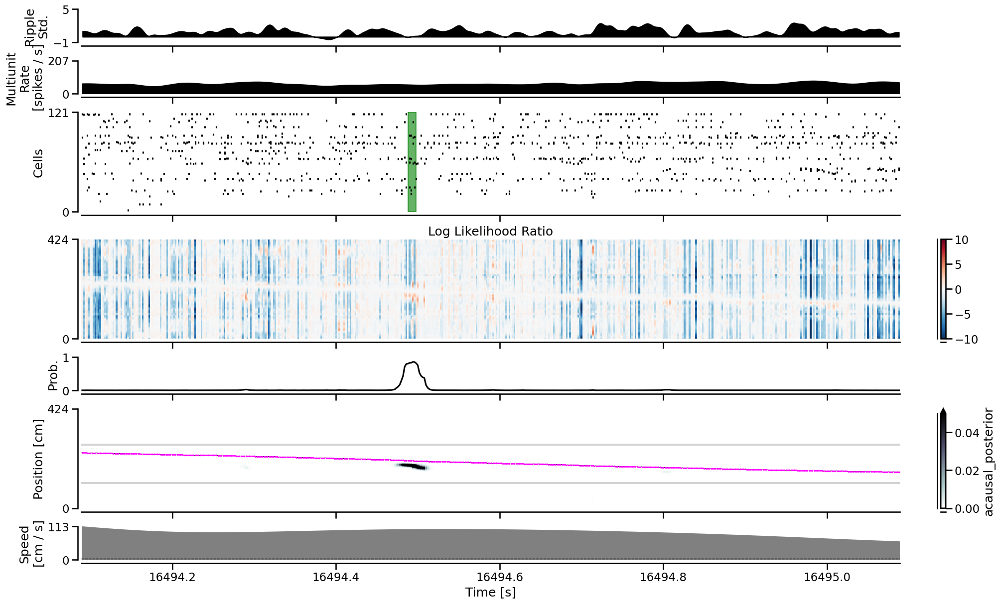

In [27]:
time_slice = slice(63_000, 63_500)
plot_detector2(time_slice, data, non_local_detector, non_local_results,
               log_likelihood_ratio,
               figsize=(20, 12.0))

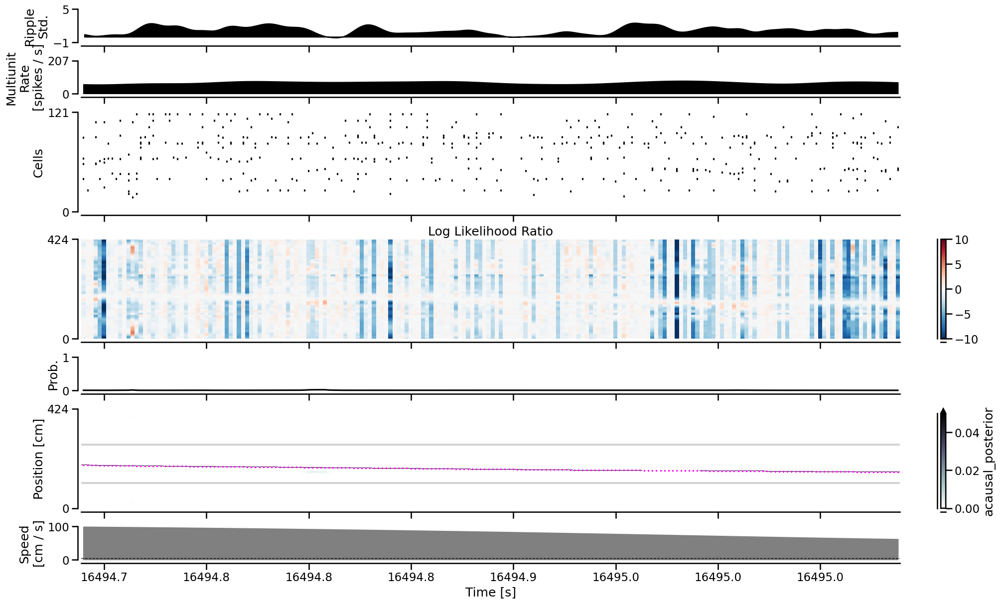

In [31]:
time_slice = slice(63_300, 63_500)
plot_detector2(time_slice, data, non_local_detector, non_local_results,
               log_likelihood_ratio,
               figsize=(20, 12.0))

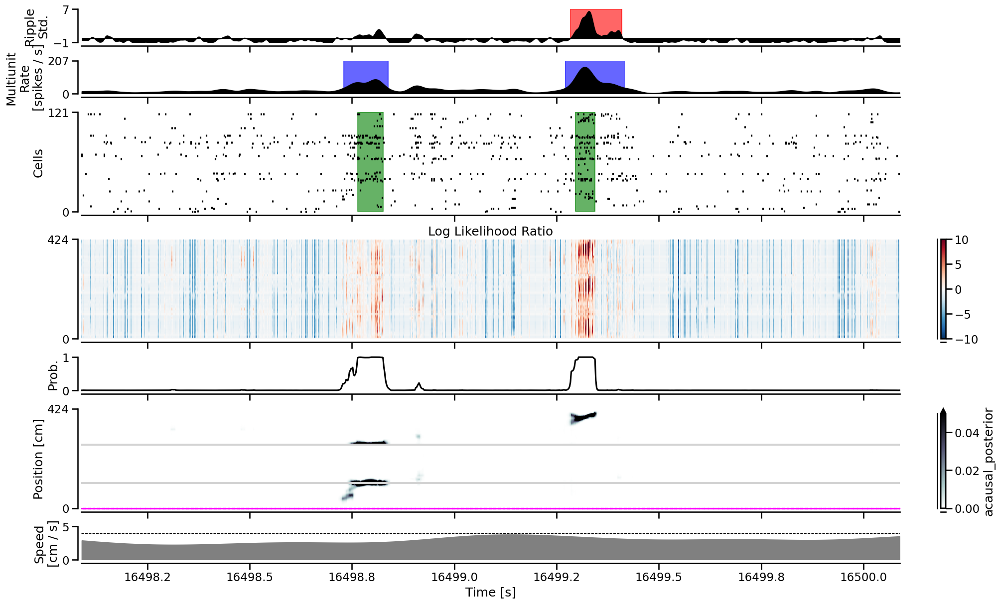

In [32]:
time_slice = slice(65_000, 66_000)
plot_detector2(time_slice, data, non_local_detector, non_local_results,
               log_likelihood_ratio,
               figsize=(20, 12.0))

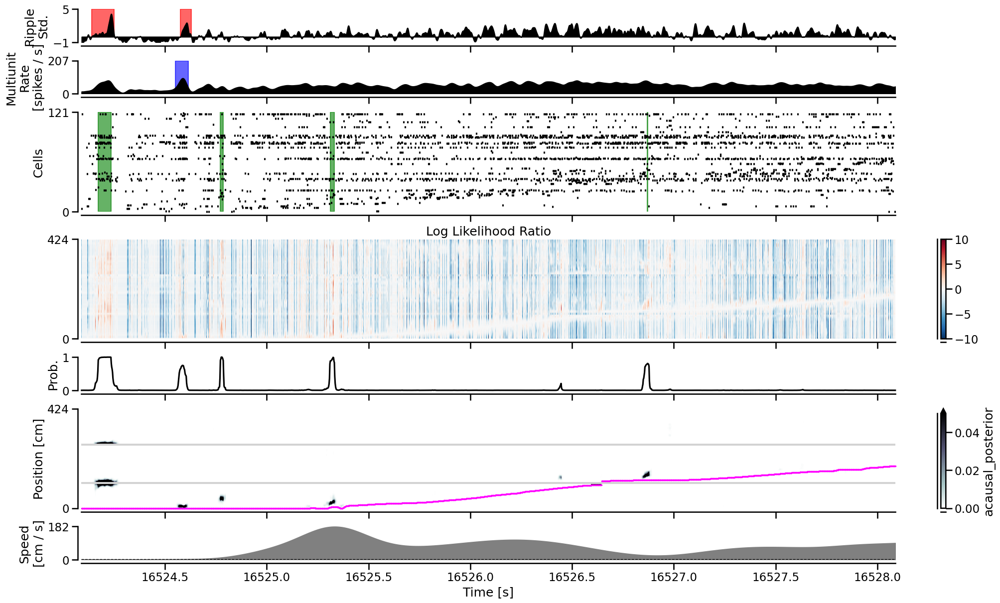

In [33]:
time_slice = slice(78_000, 80_000)

plot_detector2(time_slice, data, non_local_detector, non_local_results,
               log_likelihood_ratio,
               figsize=(20, 12.0))

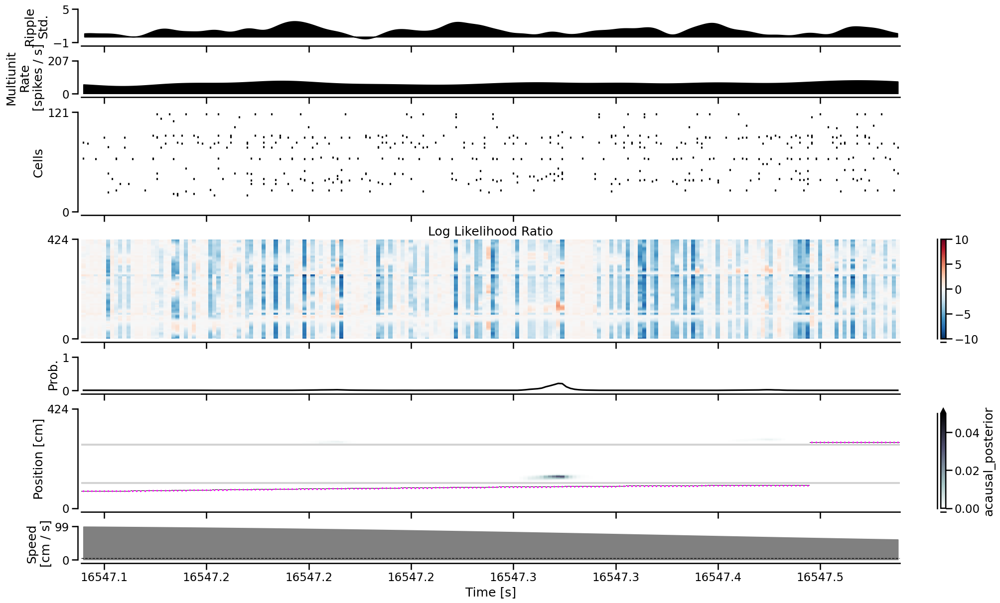

In [34]:
time_slice = slice(89_500, 89_700)
plot_detector2(time_slice, data, non_local_detector, non_local_results,
               log_likelihood_ratio,
               figsize=(20, 12.0))

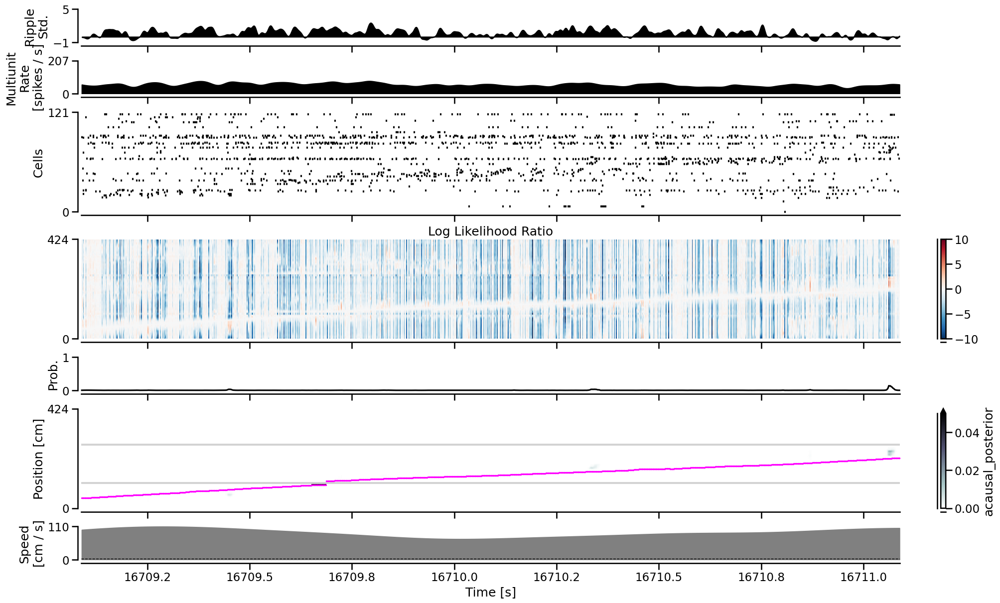

In [35]:
time_slice = slice(170_500, 171_500)
plot_detector2(time_slice, data, non_local_detector, non_local_results,
               log_likelihood_ratio,
               figsize=(20, 12.0))

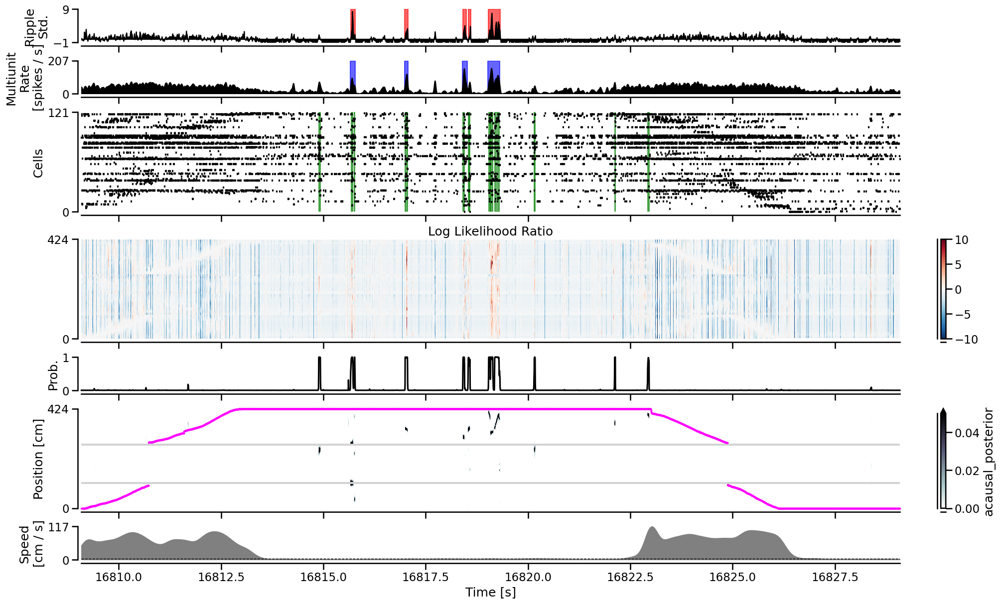

In [41]:
time_slice = slice(220_500, 230_500)
plot_detector2(time_slice, data, non_local_detector, non_local_results,
               log_likelihood_ratio,
               figsize=(20, 12.0))

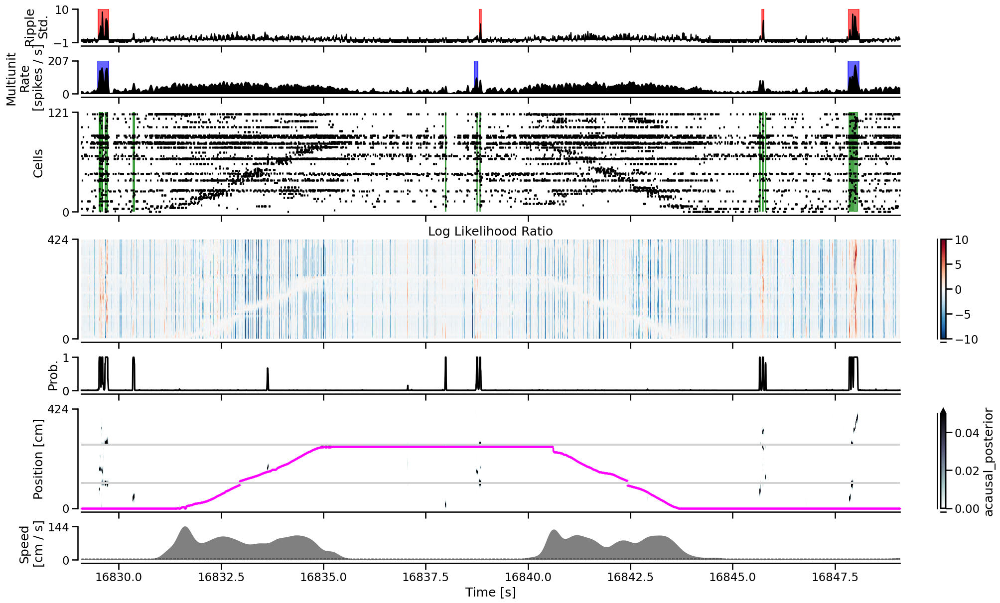

In [42]:
time_slice = slice(230_500, 240_500)
plot_detector2(time_slice, data, non_local_detector, non_local_results,
               log_likelihood_ratio,
               figsize=(20, 12.0))

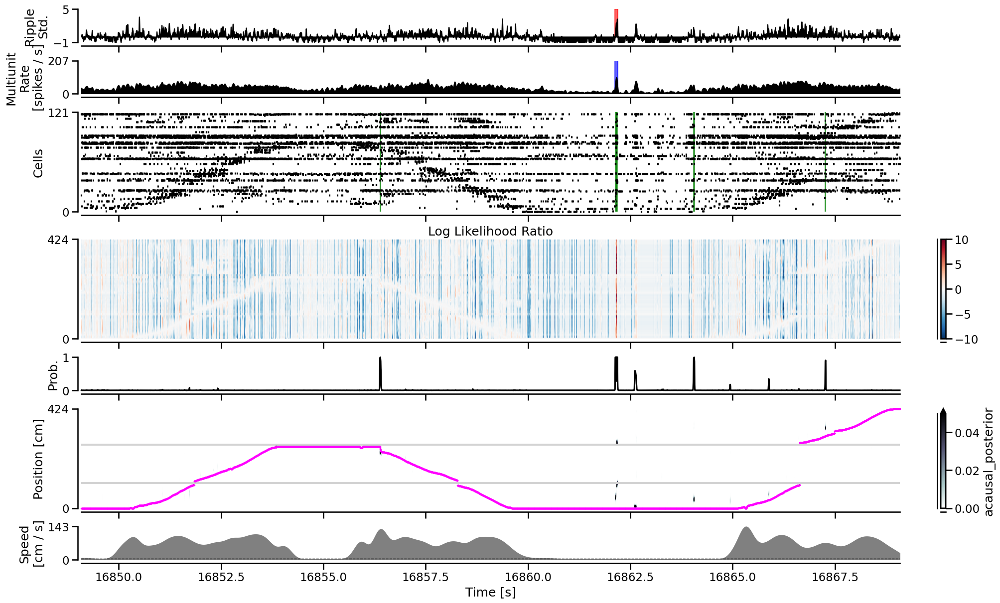

In [43]:
time_slice = slice(240_500, 250_500)
plot_detector2(time_slice, data, non_local_detector, non_local_results,
               log_likelihood_ratio,
               figsize=(20, 12.0))

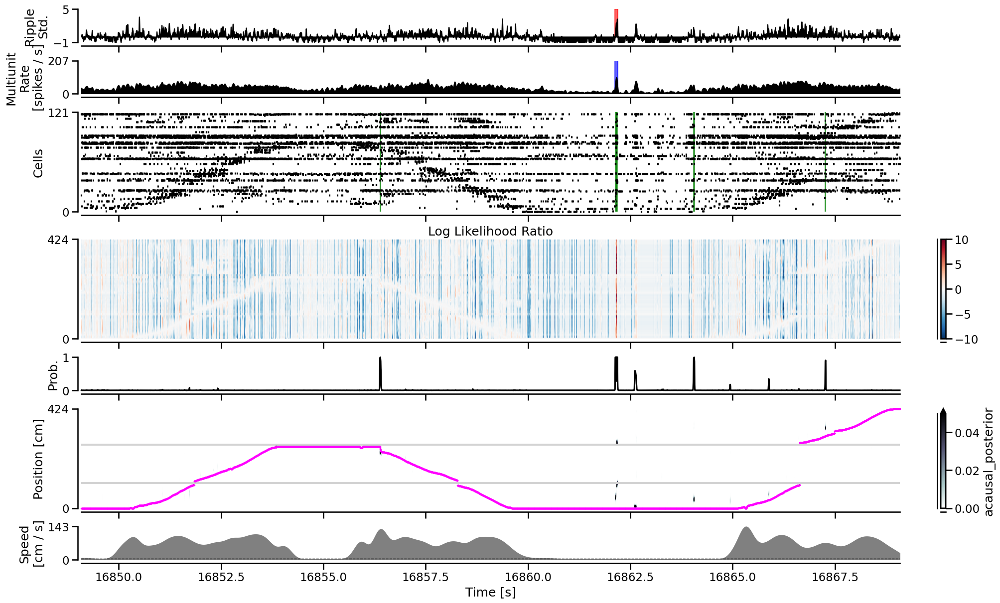

In [44]:
time_slice = slice(250_500, 260_500)
plot_detector2(time_slice, data, non_local_detector, non_local_results,
               log_likelihood_ratio,
               figsize=(20, 12.0))

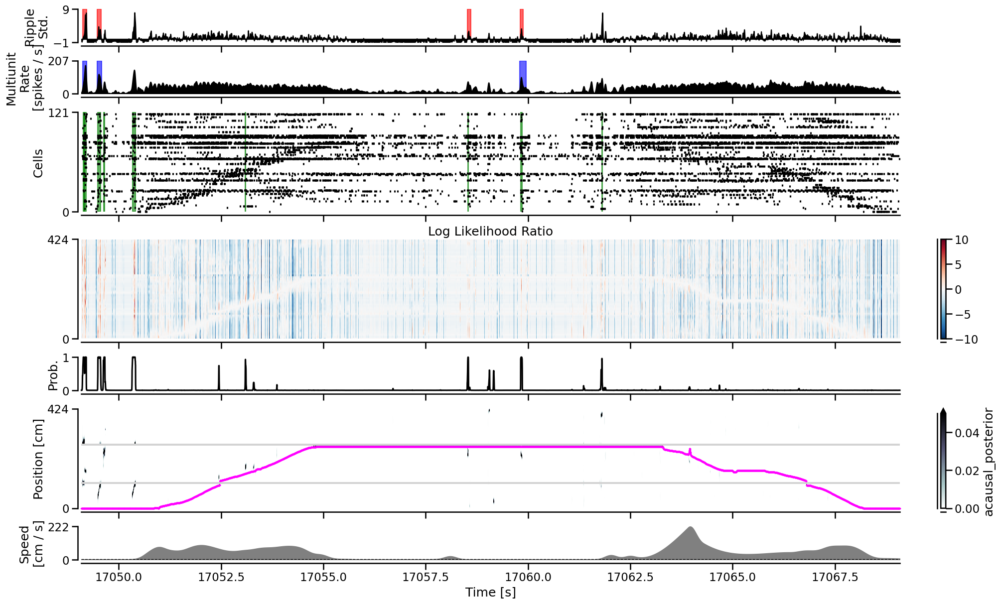

In [45]:
time_slice = slice(340_500, 350_500)
plot_detector2(time_slice, data, non_local_detector, non_local_results,
               log_likelihood_ratio,
               figsize=(20, 12.0))

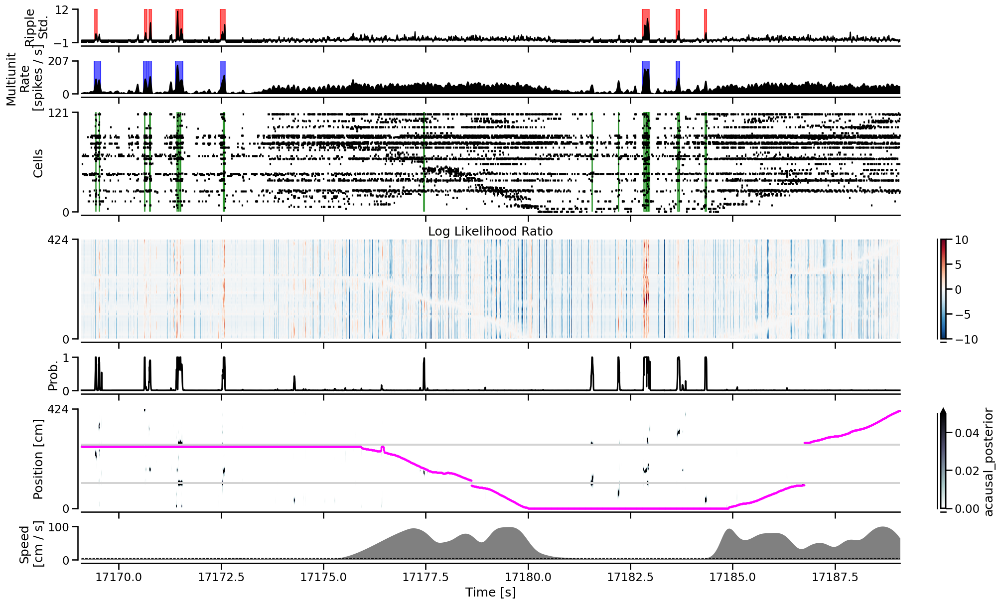

In [46]:
time_slice = slice(400_500, 410_500)
plot_detector2(time_slice, data, non_local_detector, non_local_results,
               log_likelihood_ratio,
               figsize=(20, 12.0))

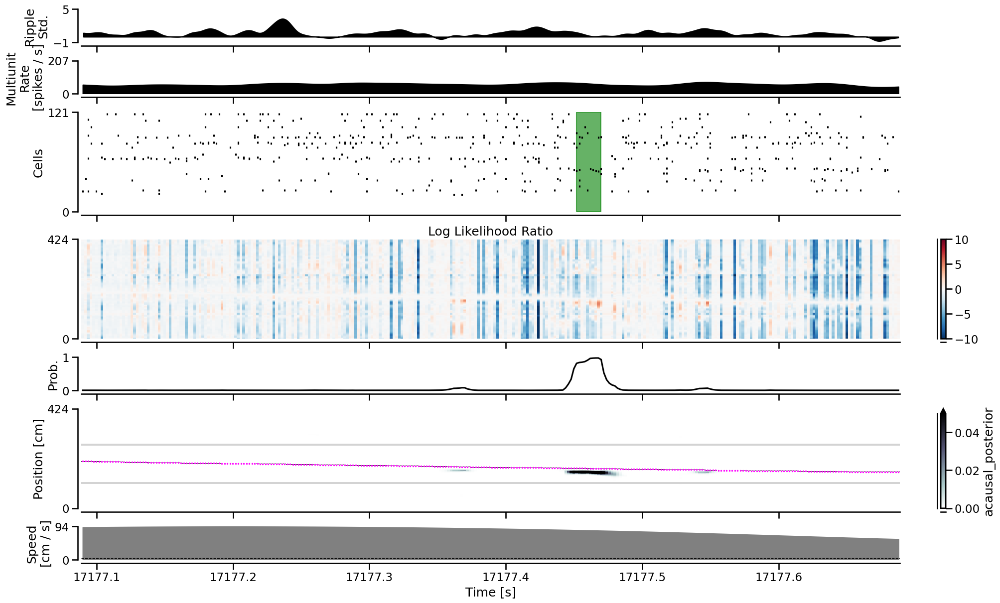

In [55]:
time_slice = slice(404_500, 404_800)
plot_detector2(time_slice, data, non_local_detector, non_local_results,
               log_likelihood_ratio,
               figsize=(20, 12.0))

In [56]:
from src.load_data import get_descending_theta

gnd_lfp, theta_filtered_lfp, is_descending = get_descending_theta(data['tetrode_info'], data['position_info'])

In [57]:
is_training = ((~data['is_ripple'].values.squeeze()) & (data['position_info'].nose_vel.values.squeeze() <= 4)) | (is_descending & (data['position_info'].nose_vel > 4))

detector_parameters = {
    'movement_var': 6.0,
    'replay_speed': 1,
    'place_bin_size': 2.0,
    'spike_model_knot_spacing': 8.0,
    'spike_model_penalty': 1E-5,
    'movement_state_transition_type': 'random_walk',
    'multiunit_model_kwargs': {
        'mark_std': 24.0, 'position_std': 4.0, 'block_size': 100},
    'discrete_state_transition_type': 'constant',
    'discrete_diagonal': np.array([0.02, 0.98])
}

In [58]:
from replay_identification import ReplayDetector
from src.parameters import WTRACK_EDGE_ORDER, WTRACK_EDGE_SPACING

non_local_detector = ReplayDetector(**detector_parameters)
logging.info(non_local_detector)

non_local_detector.fit(
    is_ripple=data['is_ripple'],
    is_training=is_training,
    speed=data['position_info'].nose_vel,
    position=data['position_info'].linear_position,
    spikes=data['spikes'],
    track_graph=data['track_graph'],
    edge_order=WTRACK_EDGE_ORDER,
    edge_spacing=WTRACK_EDGE_SPACING,
    use_gpu=False,
)

non_local_results = non_local_detector.predict(
    speed=data['position_info'].nose_vel,
    position=data['position_info'].linear_position,
    spikes=data['spikes'],
    time=data['position_info'].index / np.timedelta64(1, 's'),
    use_likelihoods=['spikes'],
    use_acausal=True,
    set_no_spike_to_equally_likely=False,
    use_gpu=False,
)
logging.info('Done!')

28-Feb-22 16:10:57 ReplayDetector(discrete_diagonal=array([0.02, 0.98]),
               discrete_state_transition_penalty=1e-05,
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_t...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 24.0,
                                       'position_std': 4.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place_bin_size=2.0, position_range=None, replay_speed=1,
               speed_knots=None, speed_threshold=4.0,
               spike_model_knot_spacing=8.0, spik

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

28-Feb-22 16:20:43 Finding causal non-local probability and position...
28-Feb-22 16:20:53 Finding acausal non-local probability and position...
28-Feb-22 16:21:32 Done!


In [59]:
from replay_identification.spiking_likelihood import *
import scipy.stats

design_matrix = non_local_detector._spiking_likelihood.keywords['design_matrix']
place_field_coefficients = non_local_detector._spiking_likelihood.keywords['place_field_coefficients']
place_conditional_intensity = non_local_detector._spiking_likelihood.keywords['place_conditional_intensity']
is_track_interior = non_local_detector._spiking_likelihood.keywords['is_track_interior']

spikes = np.asarray(data['spikes'])
position = np.asarray(data['position_info'].linear_position)

local_design_matrix = make_spline_predict_matrix(
    design_matrix.design_info, position)
local_conditional_intensity = get_firing_rate(
    local_design_matrix, place_field_coefficients, sampling_frequency=1)

non_local_likelihood = (combined_likelihood(
        spikes.T[..., np.newaxis],
        place_conditional_intensity.T[:, np.newaxis, :])).squeeze()
local_likelihood = (combined_likelihood(
        spikes.T, local_conditional_intensity.T)
    ).squeeze()
# non_local_likelihood[~is_track_interior] = np.nan
# local_likelihood[~is_track_interior] = np.nan

log_likelihood_ratio = non_local_likelihood - local_likelihood[:, np.newaxis]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

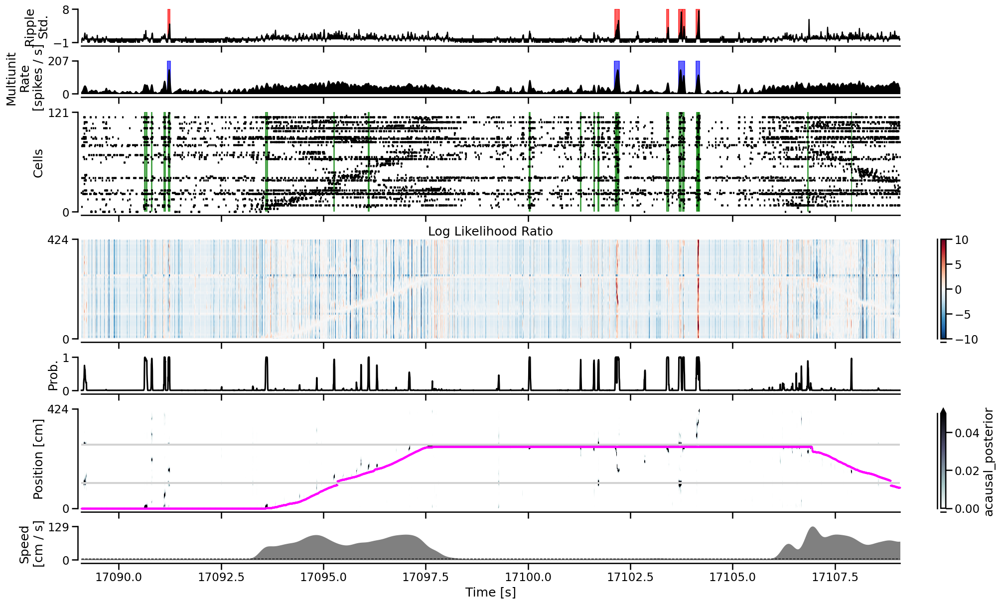

In [60]:
time_slice = slice(360_500, 370_500)
plot_detector2(time_slice, data, non_local_detector, non_local_results,
               log_likelihood_ratio,
               figsize=(20, 12.0))

In [61]:
from replay_identification import ReplayDetector
from src.parameters import WTRACK_EDGE_ORDER, WTRACK_EDGE_SPACING

non_local_detector2 = ReplayDetector(**detector_parameters)
logging.info(non_local_detector2)

non_local_detector2.fit(
    is_ripple=data['is_ripple'],
    is_training=np.ones_like(is_training),
    speed=data['position_info'].nose_vel,
    position=data['position_info'].linear_position,
    spikes=data['spikes'],
    track_graph=data['track_graph'],
    edge_order=WTRACK_EDGE_ORDER,
    edge_spacing=WTRACK_EDGE_SPACING,
    use_gpu=False,
)

# non_local_results2 = non_local_detector2.predict(
#     speed=data['position_info'].nose_vel,
#     position=data['position_info'].linear_position,
#     spikes=data['spikes'],
#     time=data['position_info'].index / np.timedelta64(1, 's'),
#     use_likelihoods=['spikes'],
#     use_acausal=True,
#     set_no_spike_to_equally_likely=False,
#     use_gpu=False,
# )
# logging.info('Done!')

28-Feb-22 16:48:55 ReplayDetector(discrete_diagonal=array([0.02, 0.98]),
               discrete_state_transition_penalty=1e-05,
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_t...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 24.0,
                                       'position_std': 4.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place_bin_size=2.0, position_range=None, replay_speed=1,
               speed_knots=None, speed_threshold=4.0,
               spike_model_knot_spacing=8.0, spik

ReplayDetector(discrete_diagonal=array([0.02, 0.98]),
               discrete_state_transition_penalty=1e-05,
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_t...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 24.0,
                                       'position_std': 4.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place_bin_size=2.0, position_range=None, replay_speed=1,
               speed_knots=None, speed_threshold=4.0,
               spike_model_knot_spacing=8.0, spike_model_penalty=1e-

In [62]:
def compare_place_fields(detector1, detector2):
    place_fields = (
        detector1._spiking_likelihood
        .keywords['place_conditional_intensity']).squeeze().copy()
    is_track_interior = detector1.is_track_interior_
    place_fields[~is_track_interior] = np.nan
    
    place_fields2 = (
        detector2._spiking_likelihood
        .keywords['place_conditional_intensity']).squeeze().copy()
    is_track_interior = detector2.is_track_interior_
    place_fields2[~is_track_interior] = np.nan
    
    n_neurons = place_fields.shape[1]
    fig, axes = plt.subplots(n_neurons, 1, figsize=(9, 0.75 * n_neurons),
                             sharex=True, constrained_layout=True)

    for neuron_ind, ax in enumerate(axes.flat):
        ax.fill_between(detector1.place_bin_centers_.squeeze(),
                        place_fields[:, neuron_ind] * 500, alpha=1)
        ax.plot(detector2.place_bin_centers_.squeeze(),
                 place_fields2[:, neuron_ind] * 500, alpha=1, color='orange')
    sns.despine()

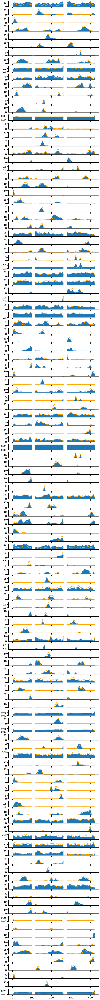

In [63]:
compare_place_fields(non_local_detector2, non_local_detector)

In [68]:
non_local_detector3 = ReplayDetector(**detector_parameters)
logging.info(non_local_detector3)

non_local_detector3.fit(
    is_ripple=data['is_ripple'],
    is_training=(1 - non_local_results.non_local_probability).values.squeeze(),
    speed=data['position_info'].nose_vel,
    position=data['position_info'].linear_position,
    spikes=data['spikes'],
    track_graph=data['track_graph'],
    edge_order=WTRACK_EDGE_ORDER,
    edge_spacing=WTRACK_EDGE_SPACING,
    use_gpu=False,
)

logging.info('Done!')

28-Feb-22 17:15:07 ReplayDetector(discrete_diagonal=array([0.02, 0.98]),
               discrete_state_transition_penalty=1e-05,
               discrete_state_transition_type='constant',
               infer_track_interior=True, is_track_interior=None,
               lfp_model=<class 'sklearn.mixture._bayesian_mixture.BayesianGaussianMixture'>,
               lfp_model_kwargs={'max_iter': 200, 'n_components': 1,
                                 'tol': 1e-06},
               movement_state_transition_t...
               multiunit_model_kwargs={'block_size': 100, 'mark_std': 24.0,
                                       'position_std': 4.0},
               multiunit_occupancy_kwargs={'bandwidth': array([6., 6.])},
               multiunit_occupancy_model=<class 'replay_identification.multiunit_likelihood.NumbaKDE'>,
               place_bin_size=2.0, position_range=None, replay_speed=1,
               speed_knots=None, speed_threshold=4.0,
               spike_model_knot_spacing=8.0, spik

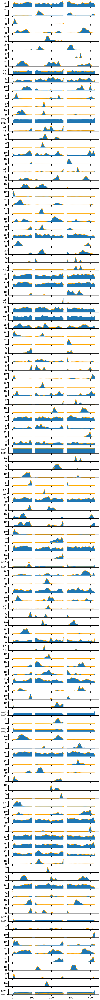

In [69]:
compare_place_fields(non_local_detector2, non_local_detector3)

In [70]:
non_local_results3 = non_local_detector3.predict(
    speed=data['position_info'].nose_vel,
    position=data['position_info'].linear_position,
    spikes=data['spikes'],
    time=data['position_info'].index / np.timedelta64(1, 's'),
    use_likelihoods=['spikes'],
    use_acausal=True,
    set_no_spike_to_equally_likely=False,
    use_gpu=False,
)
logging.info('Done!')

01-Mar-22 09:42:24 Predicting spikes likelihood...


neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

01-Mar-22 09:44:09 Finding causal non-local probability and position...
01-Mar-22 09:44:19 Finding acausal non-local probability and position...
01-Mar-22 09:45:00 Done!


In [71]:
from replay_identification.spiking_likelihood import *
import scipy.stats

design_matrix = non_local_detector3._spiking_likelihood.keywords['design_matrix']
place_field_coefficients = non_local_detector3._spiking_likelihood.keywords['place_field_coefficients']
place_conditional_intensity = non_local_detector3._spiking_likelihood.keywords['place_conditional_intensity']
is_track_interior = non_local_detector3._spiking_likelihood.keywords['is_track_interior']

spikes = np.asarray(data['spikes'])
position = np.asarray(data['position_info'].linear_position)

local_design_matrix = make_spline_predict_matrix(
    design_matrix.design_info, position)
local_conditional_intensity = get_firing_rate(
    local_design_matrix, place_field_coefficients, sampling_frequency=1)

non_local_likelihood = (combined_likelihood(
        spikes.T[..., np.newaxis],
        place_conditional_intensity.T[:, np.newaxis, :])).squeeze()
local_likelihood = (combined_likelihood(
        spikes.T, local_conditional_intensity.T)
    ).squeeze()
# non_local_likelihood[~is_track_interior] = np.nan
# local_likelihood[~is_track_interior] = np.nan

log_likelihood_ratio = non_local_likelihood - local_likelihood[:, np.newaxis]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

neurons:   0%|          | 0/121 [00:00<?, ?it/s]

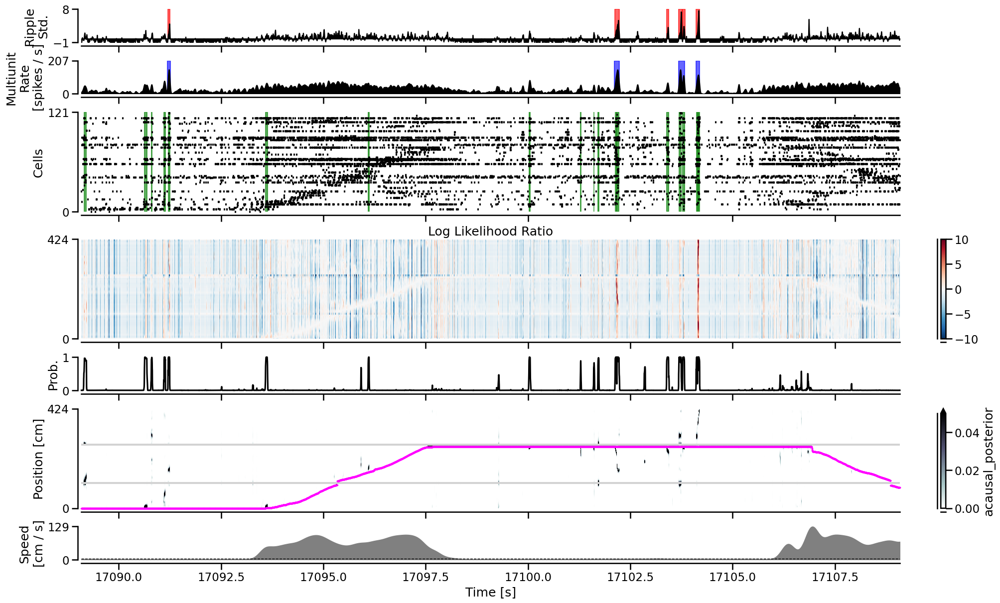

In [72]:
time_slice = slice(360_500, 370_500)
plot_detector2(time_slice, data, non_local_detector3, non_local_results3,
               log_likelihood_ratio,
               figsize=(20, 12.0))

In [ ]:
ee